<a href="https://colab.research.google.com/github/ariefshecter/Implementasi-dan-Analisis-Model-CNN-untuk-Klasifikasi-Gambar-Hewan/blob/main/Implementasi_dan_Analisis_Model_CNN_untuk_Klasifikasi_Gambar_Hewan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Mengimpor Library untuk Klasifikasi Spesies Hewan<a id='import'></a>
Impor library di awal proyek ini diperlukan untuk memuat dan memanipulasi dataset, membangun model deep learning, serta memvisualisasikan hasilnya. Library-library tersebut menyediakan fungsi dan alat untuk pra-pemrosesan data, arsitektur dan pelatihan model, serta evaluasi hasil. Hal ini memengaruhi proyek dengan memungkinkan kita bekerja secara efisien dan efektif dengan dataset serta membangun model yang berkinerja tinggi.


In [ ]:
# Import libraries
import os  # For interacting with the file system
import shutil  # For managing files and directories in a cross-platform manner
import keras  # For building deep learning models
import numpy as np  # For numerical operations on arrays
from glob import glob  # For finding file paths
from tqdm import tqdm  # For progress bars

# Data preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data visualization
import seaborn as sns  # For statistical visualizations
import plotly.graph_objs as go  # For interactive visualizations
import matplotlib.pyplot as plt  # For creating static plots

# Model architecture
from keras import Sequential  # For building sequential models
from keras.models import load_model  # For loading pre-trained models
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout  # For defining model layers

# Training callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping  # For training callbacks

# Pre-trained models
from tensorflow.keras.applications import InceptionV3, Xception, ResNet152V2  # For using pre-trained models


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# 2. Menjelajahi Dataset Animal-10: Mendapatkan Nama Kelas dan Menghitung Jumlah Kelas<a id='data-exploration'></a>
Pada bagian proyek ini, kita menetapkan path menuju dataset Animal-10 dan mendapatkan daftar nama kelas dari dataset tersebut. Selanjutnya, kita menghitung jumlah kelas dan mencetak nama-nama kelas asli serta total jumlah kelas. Informasi ini penting untuk memahami struktur dataset dan mempersiapkannya agar dapat digunakan dalam model deep learning.


In [ ]:
# Path setelah mounting Google Drive
data_path = '/content/drive/MyDrive/raw-img'

# Get a list of class names from the data path
class_names = sorted(os.listdir(data_path))

# Count the number of classes
num_classes = len(class_names)

# Print the class names and the total number of classes
print("Class Names: \n", class_names)
print("Number of Classes:", num_classes)


Class Names: 
 ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
Number of Classes: 10


Kode tersebut mencetak nama-nama kelas dan total jumlah kelas dalam dataset Animal-10. Berdasarkan output yang dihasilkan, kita dapat mengamati bahwa terdapat total 10 kelas dalam dataset dan nama-nama kelas tersebut ditulis dalam bahasa Italia.

Nama-nama kelas ini mewakili berbagai jenis hewan yang menjadi target dari model klasifikasi gambar kita. Dengan mengetahui jumlah dan nama-nama kelas tersebut, kita dapat lebih memahami struktur dataset dan mempersiapkannya dengan lebih baik untuk pelatihan model deep learning.


# 3. Memeriksa Distribusi Kelas dalam Dataset Animal-10<a id='data-examination'></a>
Dengan memperoleh jumlah sampel pada setiap kelas, kita dapat menghitung distribusi kelas dan menentukan apakah dataset tersebut seimbang (balanced) atau tidak seimbang (imbalanced).

Informasi ini dapat digunakan untuk memutuskan apakah langkah tambahan seperti augmentasi data (data augmentation) atau pemberian bobot pada kelas (class weighting) diperlukan untuk menyeimbangkan dataset dan meningkatkan performa model deep learning.


In [ ]:
# Get the number of samples in each class
class_sizes = []
for name in class_names:
    class_size = len(os.listdir(data_path + "/" + name))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [4873, 2623, 1446, 2112, 3098, 1668, 1876, 1820, 4821, 1872]


In [ ]:
# to convert lists to dictionary **************
class_name_size = dict(zip(class_names, class_sizes))

In [ ]:
class_name_size

{'cane': 4873,
 'cavallo': 2623,
 'elefante': 1446,
 'farfalla': 2112,
 'gallina': 3098,
 'gatto': 1668,
 'mucca': 1876,
 'pecora': 1820,
 'ragno': 4821,
 'scoiattolo': 1872}

Kode tersebut mencetak daftar angka yang menunjukkan jumlah sampel pada setiap kelas dalam dataset Animal-10. Berdasarkan output-nya, kita dapat mengamati bahwa distribusi kelas tidak seimbang, karena jumlah sampel di tiap kelas sangat bervariasi. Kelas dengan jumlah sampel paling sedikit, yaitu "elefante", hanya memiliki 1446 sampel, sedangkan kelas dengan jumlah sampel terbanyak, yaitu "cane", memiliki 4863 sampel.

Ketidakseimbangan ini dapat memengaruhi performa model deep learning yang dilatih pada dataset tersebut, karena model cenderung bias terhadap kelas mayoritas dan memiliki akurasi yang lebih rendah pada kelas minoritas. Oleh karena itu, mungkin diperlukan teknik tambahan seperti augmentasi data (data augmentation) atau pemberian bobot pada kelas (class weighting) untuk menyeimbangkan dataset dan meningkatkan performa model.


# 4. Memvisualisasikan Distribusi Kelas dalam Dataset Animal-10 Menggunakan Diagram Lingkaran dan Grafik Batang<a id='visualizing-class-distribution'></a>
Kode di bawah ini memberikan representasi visual dari distribusi kelas dalam dataset Animal-10 menggunakan diagram lingkaran (pie chart), yang dapat membantu kita memahami dataset dengan lebih baik dan mengidentifikasi adanya ketidakseimbangan antar kelas.


In [ ]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

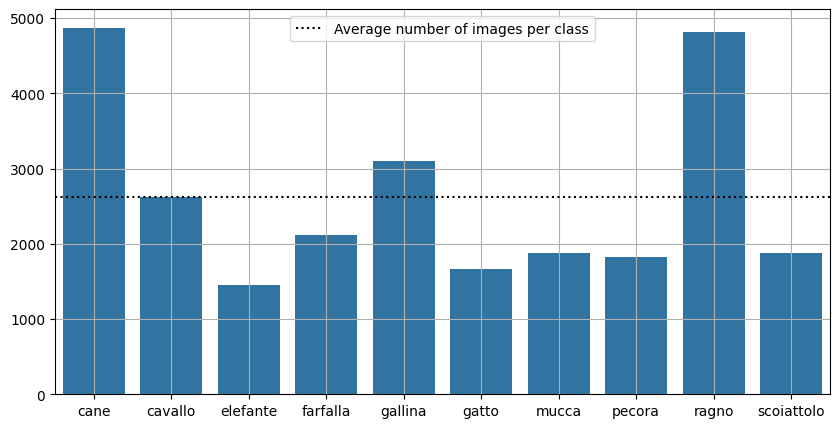

In [ ]:
# Plot a bar graph of the number of images in each class

# Set the size of the figure
plt.figure(figsize=(10,5))

# Plot a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes)

# Add a grid to the plot
plt.grid()

# Add a horizontal line to show the mean number of images across all classes
plt.axhline(np.mean(class_sizes), color='black', linestyle=':', label="Average number of images per class")

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

In [ ]:
np.min(class_sizes)

np.int64(1446)

Grafik batang (bar graph) memberikan representasi visual tambahan dari distribusi jumlah gambar di setiap kelas dalam dataset Animal-10. Visualisasi ini membantu kita memahami struktur dataset dengan lebih jelas dan mengidentifikasi apakah terdapat ketidakseimbangan jumlah data antar kelas.


# 5. Melakukan Sampling dan Membuat Direktori Data<a id='data-sampling'></a>
Pada kode di bawah ini, kita membuat dataset yang lebih kecil dan mudah dikelola untuk pelatihan dan pengujian model machine learning. Selain itu, kita juga memetakan nama-nama kelas dalam bahasa Italia ke dalam bahasa Inggris untuk menciptakan konvensi penamaan kelas yang lebih mudah dipahami.


In [ ]:
# Set the path to the directory where the sampled data will be saved
sampled_data_path = './sampled-data'

# Create the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Set the percentage of each class to sample
sample_percent = 0.1

# Define a dictionary that maps the original class names to their English names
class_names_dict = {
    'cane': 'dog',
    'cavallo': 'horse',
    'elefante': 'elephant',
    'farfalla': 'butterfly',
    'gallina': 'chicken',
    'gatto': 'cat',
    'mucca': 'cow',
    'pecora': 'sheep',
    'ragno': 'spider',
    'scoiattolo': 'squirrel'
}

# Loop through each class directory and copy 2000 images or less to the sampled data directory
for class_name in os.listdir(data_path):
    # Get the path to the original class directory
    class_path = os.path.join(data_path, class_name)
    # Get the English name of the class
    class_name_en = class_names_dict[class_name]
    # Get the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)
    # Create the sampled class directory and fill it up only if it doesn't exist ********
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
        # Get a list of all the image files in the class directory
        image_files = os.listdir(class_path)
        # Calculate the number of images to sample **************
        image_class_size = class_name_size[class_name]
        if image_class_size > 2000:
            num_images = 2000
        else:
            num_images = int(image_class_size)
        # Sample the images
        sampled_images = np.random.choice(image_files, size=num_images, replace=False)
        # Copy the sampled images to the sampled class directory
        for image_name in sampled_images:
            src_path = os.path.join(class_path, image_name)
            dst_path = os.path.join(sampled_class_path, image_name)
            shutil.copyfile(src_path, dst_path)


Kita juga menganalisis distribusi kelas dari dataset sampel dengan terlebih dahulu mendapatkan daftar nama kelas dan jumlah sampel di setiap kelas dari direktori data sampel. Selanjutnya, kita mencetak distribusi kelas tersebut untuk memahami bagaimana dataset tersebar di berbagai kelas.

Untuk memberikan representasi visual dari distribusi ini, kita membuat diagram lingkaran (pie chart).

Visualisasi ini memudahkan kita untuk dengan cepat mengidentifikasi kelas mana yang memiliki lebih banyak atau lebih sedikit sampel, serta membantu dalam mengenali potensi masalah ketidakseimbangan kelas yang mungkin perlu ditangani selama pelatihan model.


In [ ]:
# Get a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Get the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)


Class Distribution:
 [2000, 1668, 2000, 1876, 2000, 1446, 2000, 1820, 2000, 1872]


In [ ]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

# 6. Persiapan dan Augmentasi Data<a id='data-preparation'></a>
Di sini kita menginisialisasi sebuah **ImageDataGenerator** dan menggunakannya untuk memuat data pelatihan dan validasi untuk model klasifikasi citra dalam proyek ini. Generator ini menerapkan berbagai transformasi dan teknik praproses gambar, seperti:

* **Rescaling** nilai piksel (misalnya dari 0–255 menjadi 0–1),
* **Flipping** gambar secara horizontal dan vertikal,
* **Rotasi acak** gambar dalam rentang derajat tertentu.

Transformasi-transformasi ini membantu meningkatkan **keragaman data pelatihan**, yang dapat memperkuat kemampuan model untuk **menggeneralisasi ke gambar baru yang belum pernah dilihat sebelumnya**.

Selain itu, generator ini juga membagi data menjadi **set pelatihan dan validasi**, dengan **20% data disisihkan untuk validasi**. Hal ini memungkinkan model dilatih dengan jumlah data yang lebih besar, sambil tetap dievaluasi menggunakan data terpisah guna **mencegah overfitting**.


In [ ]:
# Initialize Generator with the specified image transformations and preprocessing
# rescale: normalizes pixel values from 0-255 to 0-1
# horizontal_flip: randomly flips images horizontally
# vertical_flip: randomly flips images vertically
# rotation_range: randomly rotates images by a given range in degrees
# validation_split: splits the data into training and validation sets, with 20% of the data used for validation
data_generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    validation_split=0.2)

# Load training data from the specified directory and apply the generator
# target_size: resizes the images to a specified size
# class_mode: specifies the type of label encoding, binary for 2 classes
# batch_size: specifies the number of samples per batch
# shuffle: shuffles the data after each epoch
# subset: specifies the subset of data to load, in this case, the training set
train_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='training')

# Load validation data from the specified directory and apply the generator
# subset: specifies the subset of data to load, in this case, the validation set
valid_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='validation')

Found 14947 images belonging to 10 classes.
Found 3735 images belonging to 10 classes.


Informasi output tersebut memberi tahu kita tentang jumlah gambar dan jumlah kelas dalam **set pelatihan** dan **set validasi**. Secara spesifik:

* Terdapat **14947 gambar** dalam **set pelatihan**.
* Terdapat **3735 gambar** dalam **set validasi**.
* Semua gambar tersebut termasuk ke dalam **10 kelas berbeda**.

Informasi ini penting untuk memastikan bahwa dataset telah dibagi dengan benar dan bahwa model akan dilatih dan divalidasi dengan proporsi data yang sesuai.


# 7. Visualisasi Data<a id='data-visualization'></a>
Kita membuat fungsi **show\_image()** untuk menampilkan sebuah gambar beserta judul opsional. Fungsi ini digunakan pada bagian-bagian selanjutnya dari kode untuk menampilkan contoh gambar dari dataset atau gambar hasil prediksi dari model.

Sementara itu, fungsi **get\_random\_data()** digunakan untuk secara acak memilih satu data (gambar beserta labelnya) dari dataset yang diberikan. Fungsi ini dipakai di bagian selanjutnya untuk memilih data secara acak dan menampilkan gambarnya menggunakan fungsi **show\_image()**.


In [ ]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)

    # Set the title of the plot if provided
    plt.title(image_title)

    # Turn off the axes in the plot
    plt.axis('off')

In [ ]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # get a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # select the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # return the selected image and label
    return image, label


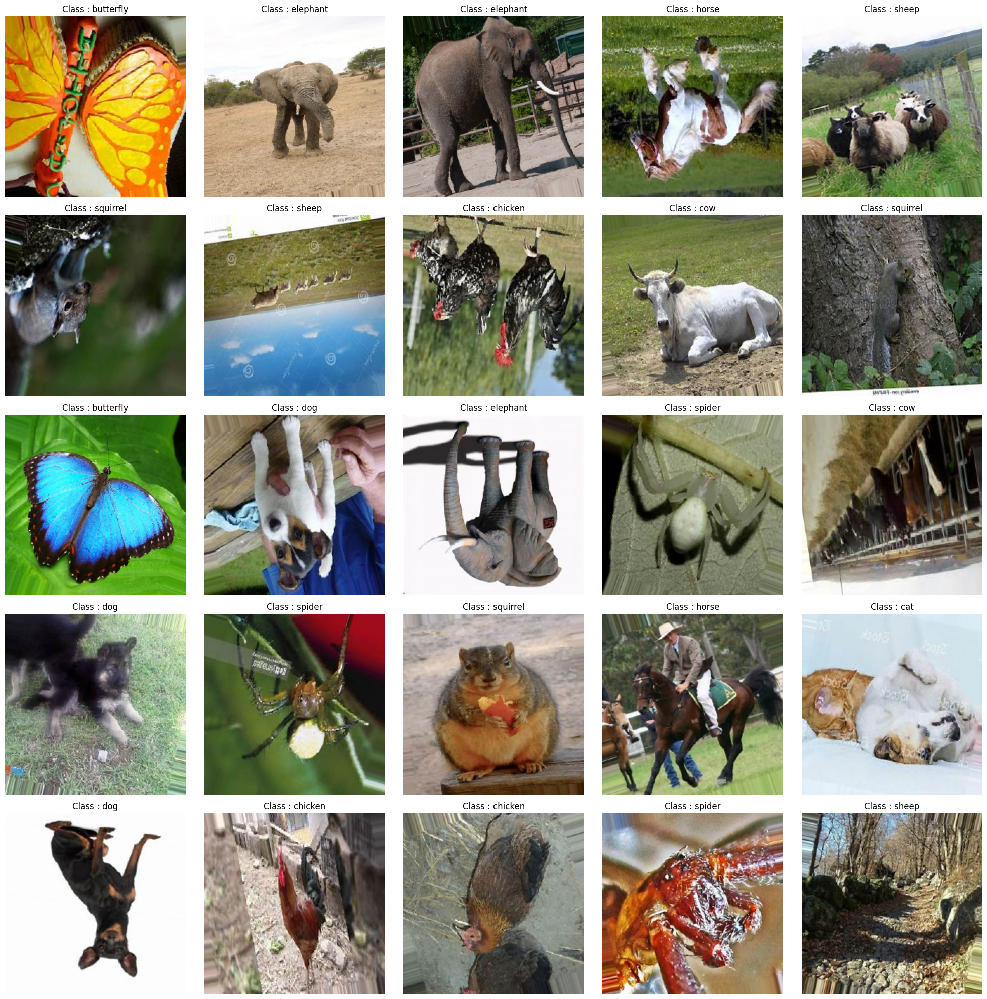

In [ ]:
# Set the figure size for the plot
plt.figure(figsize=(20,20))

# Initialize a counter for the subplots
counter=1

# Loop over the train dataset
for images, labels in iter(train_data):

    # Get a random image and label
    image, label = get_random_data([images, labels])

    # Plot the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")

    # Increment the counter
    counter+=1

    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()


Kami menulis kode ini untuk memvisualisasikan **25 gambar sampel acak** dari dataset pelatihan. Berikut penjelasan prosesnya:

* Ukuran gambar (figure size) untuk plot diatur agar tampilan hasilnya jelas dan rapi.
* Inisialisasi penghitung subplot untuk mengatur posisi gambar dalam grid.
* Melakukan loop pada dataset pelatihan untuk mengambil gambar dan label secara acak.
* Pada setiap iterasi, fungsi **show\_image()** dipanggil untuk menampilkan gambar beserta nama kelasnya sebagai judul.
* Setelah 25 gambar ditampilkan, loop dihentikan.
* Tata letak (layout) plot diatur agar gambar-gambar tidak saling tumpang tindih dan terlihat rapi sebelum akhirnya ditampilkan.

Kode ini sangat berguna untuk:

* Mendapatkan gambaran isi dan kualitas gambar dalam dataset.
* Memahami distribusi kelas di dalam dataset.
* Memudahkan kita melihat variasi yang ada di tiap kelas.
* Membantu mendeteksi kemungkinan masalah atau kesalahan pada tahap praproses data atau pelabelan.

Dengan visualisasi ini, kita bisa lebih yakin bahwa data yang akan digunakan sudah sesuai dan siap untuk pelatihan model.


# 8. Model Training<a id='model training'></a>
Berikut ini adalah penjelasan dalam Bahasa Indonesia untuk kode tersebut:

Pada kode di bawah ini, kita melatih dan mengevaluasi **3 model deep learning pra-latih berbeda** (ResNet152V2, InceptionV3, dan Xception) menggunakan dataset gambar yang tersedia. Untuk setiap model, langkah-langkah yang dilakukan adalah:

1. Memuat model pra-latih (pre-trained model).
2. Membekukan bobot (freeze weights) model tersebut dan menghilangkan lapisan klasifikasi terakhir.
3. Membangun model sequential dengan menambahkan:

   * Lapisan global average pooling,
   * Dua lapisan fully connected (dense),
   * Lapisan klasifikasi akhir dengan fungsi aktivasi softmax.
4. Mengkompilasi model menggunakan:

   * Fungsi loss **sparse categorical cross-entropy**,
   * Optimizer **Adam**,
   * Metode evaluasi **akurasi**.

Selanjutnya, kita mengatur **callback EarlyStopping** dan **ModelCheckpoint** untuk memantau proses pelatihan serta menyimpan bobot model terbaik. Terakhir, model dilatih menggunakan data pelatihan dan validasi dengan jumlah maksimal 50 epoch dan callback yang sudah ditentukan.

Proses ini memungkinkan kita untuk membandingkan performa ketiga model tersebut pada dataset yang sama dan mendapatkan model terbaik secara otomatis berdasarkan hasil validasi.


In [ ]:
# Specify the name of the model as "ResNet152V2".
name = "ResNet152V2"

# Load the pre-trained ResNet152V2 model, freeze its weights and exclude its final classification layer.
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the ResNet152V2 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
resnet152V2 = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
resnet152V2.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)


234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - accuracy: 0.8072 - loss: 0.6247

468/468 ━━━━━━━━━━━━━━━━━━━━ 377s 741ms/step - accuracy: 0.8073 - loss: 0.6243 - val_accuracy: 0.8731 - val_loss: 0.3763
Epoch 2/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 551ms/step - accuracy: 0.9043 - loss: 0.3046

468/468 ━━━━━━━━━━━━━━━━━━━━ 323s 689ms/step - accuracy: 0.9043 - loss: 0.3046 - val_accuracy: 0.9033 - val_loss: 0.2840
Epoch 3/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - accuracy: 0.9121 - loss: 0.2684

468/468 ━━━━━━━━━━━━━━━━━━━━ 325s 694ms/step - accuracy: 0.9121 - loss: 0.2684 - val_accuracy: 0.9143 - val_loss: 0.2591
Epoch 4/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 551ms/step - accuracy: 0.9207 - loss: 0.2432

468/468 ━━━━━━━━━━━━━━━━━━━━ 322s 687ms/step - accuracy: 0.9207 - loss: 0.2432 - val_accuracy: 0.9242 - val_loss: 0.2325
Epoch 5/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 321s 686ms/step - accuracy: 0.9276 - loss: 0.2160 - val_accuracy: 0.9199 - val_loss: 0.2472
Epoch 6/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 320s 685ms/step - accuracy: 0.9219 - loss: 0.2335 - val_accuracy: 0.9173 - val_loss: 0.2485
Epoch 7/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 316s 676ms/step - accuracy: 0.9330 - loss: 0.2019 - val_accuracy: 0.9210 - val_loss: 0.2329


In [ ]:
# Specify the name of the model as "Inception".
name = "Inception"

# Load the pre-trained InceptionV3 model, freeze its weights and exclude its final classification layer.
base_model = InceptionV3(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the InceptionV3 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
inception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
inception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
inception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 537ms/step - accuracy: 0.7686 - loss: 0.7372

468/468 ━━━━━━━━━━━━━━━━━━━━ 357s 723ms/step - accuracy: 0.7688 - loss: 0.7368 - val_accuracy: 0.8851 - val_loss: 0.3532
Epoch 2/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 301s 644ms/step - accuracy: 0.8705 - loss: 0.3961 - val_accuracy: 0.8817 - val_loss: 0.3554
Epoch 3/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 303s 648ms/step - accuracy: 0.8752 - loss: 0.3766 - val_accuracy: 0.8822 - val_loss: 0.3591
Epoch 4/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - accuracy: 0.8864 - loss: 0.3371

468/468 ━━━━━━━━━━━━━━━━━━━━ 299s 638ms/step - accuracy: 0.8864 - loss: 0.3370 - val_accuracy: 0.8993 - val_loss: 0.2933
Epoch 5/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 297s 635ms/step - accuracy: 0.8991 - loss: 0.3170 - val_accuracy: 0.9009 - val_loss: 0.3107
Epoch 6/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 295s 629ms/step - accuracy: 0.9067 - loss: 0.2841 - val_accuracy: 0.8932 - val_loss: 0.3307
Epoch 7/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 304s 649ms/step - accuracy: 0.9025 - loss: 0.2860 - val_accuracy: 0.9020 - val_loss: 0.3314


In [ ]:
# Specify the name of the model as "Xception".
name = "Xception"

# Load the pre-trained Xception model, freeze its weights and exclude its final classification layer.
base_model = Xception(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the Xception base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
xception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
xception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
xception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)


83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 530ms/step - accuracy: 0.8016 - loss: 0.6210

468/468 ━━━━━━━━━━━━━━━━━━━━ 333s 680ms/step - accuracy: 0.8017 - loss: 0.6207 - val_accuracy: 0.8787 - val_loss: 0.3698
Epoch 2/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - accuracy: 0.8906 - loss: 0.3455

468/468 ━━━━━━━━━━━━━━━━━━━━ 306s 654ms/step - accuracy: 0.8906 - loss: 0.3455 - val_accuracy: 0.9012 - val_loss: 0.3015
Epoch 3/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 304s 649ms/step - accuracy: 0.8969 - loss: 0.3122 - val_accuracy: 0.9004 - val_loss: 0.3081
Epoch 4/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.9062 - loss: 0.2859

468/468 ━━━━━━━━━━━━━━━━━━━━ 303s 648ms/step - accuracy: 0.9062 - loss: 0.2859 - val_accuracy: 0.9025 - val_loss: 0.3005
Epoch 5/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 305s 651ms/step - accuracy: 0.9129 - loss: 0.2647 - val_accuracy: 0.8897 - val_loss: 0.3300
Epoch 6/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 301s 643ms/step - accuracy: 0.9183 - loss: 0.2587 - val_accuracy: 0.9036 - val_loss: 0.3116
Epoch 7/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 326s 652ms/step - accuracy: 0.9169 - loss: 0.2460 - val_accuracy: 0.8806 - val_loss: 0.3967


Berdasarkan hasil output dari ketiga model, ResNet152V2 mencapai akurasi validasi tertinggi yaitu **91,43%** setelah 3 epoch pelatihan. Model InceptionV3 memperoleh akurasi validasi sebesar **89,32%** setelah 6 epoch, sedangkan Xception mencapai akurasi validasi **88,06%** setelah 7 epoch pelatihan. ResNet152V2 juga meraih akurasi pelatihan sebesar **92,1%** setelah 7 epoch, yang menunjukkan bahwa model ini kemungkinan merupakan model terbaik dari ketiganya.


# 9. Memuat Model ResNet152V2 yang Telah Dilatih Sebelumnya dan Mencetak Ringkasannya.<a id='model-summary'></a>
Di bagian ini, kita memuat model ResNet152V2 yang sudah dilatih sebelumnya (pre-trained) dan menampilkan ringkasan arsitekturnya. Model pre-trained tersebut dimuat dari path file menggunakan fungsi **load\_model**. Selanjutnya, kita menggunakan metode **summary** untuk menampilkan arsitektur model, yang mencakup beberapa lapisan seperti lapisan konvolusi, pooling, dan dense. Ringkasan ini juga menunjukkan total jumlah parameter dalam model serta berapa banyak parameter yang dapat dilatih (trainable).

Kita memuat model ResNet152V2 pre-trained dan mencetak ringkasannya untuk mendapatkan gambaran umum tentang arsitektur dan jumlah parameternya. Hal ini dilakukan untuk memastikan model telah dimuat dengan benar dan untuk melihat jumlah parameter yang dapat dilatih, yang nantinya penting saat kita melakukan fine-tuning model tersebut.


In [ ]:
# set the file path to the pre-trained model
model_file_path = '/content/ResNet152V2.h5'

# load the pre-trained model
loaded_model = load_model(model_file_path)

# print a summary of the model's architecture
loaded_model.summary()

Model: "ResNet152V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet152v2 (Functional)        │ (None, 8, 8, 2048)     │    58,331,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 58,858,764 (224.53 MB)

 Trainable params: 527,114 (2.01 MB)

 Non-trainable params: 58,331,648 (222.52 MB)

 Optimizer params: 2 (12.00 B)

# 10. Evaluasi Model ResNet152V2 yang Telah Dilatih Sebelumnya pada Dataset Validasi.<a id='model-evaluation'></a>
Baris kode di bawah ini digunakan untuk mengevaluasi performa model ResNet152V2 yang sudah dilatih sebelumnya pada dataset validasi.

Output dari baris kode ini memberikan gambaran tentang seberapa baik model pre-trained tersebut bekerja pada data validasi, yang merupakan indikator penting untuk melihat performa model pada data yang belum pernah dilihat sebelumnya (unseen data). Jika performanya baik, itu berarti model pre-trained sudah mempelajari fitur-fitur yang relevan dan berguna untuk tugas klasifikasi yang kita lakukan.


In [ ]:
#This line of code evaluates the performance of the pre-trained model on the validation dataset.
loaded_model.evaluate(valid_data)

117/117 ━━━━━━━━━━━━━━━━━━━━ 77s 562ms/step - accuracy: 0.9192 - loss: 0.2386


[0.23617233335971832, 0.9202141761779785]

Output menunjukkan bahwa model pre-trained mencapai akurasi validasi sebesar 90,39% dan nilai loss validasi sebesar 0,2987. Ini mengindikasikan bahwa model tersebut bekerja dengan cukup baik pada dataset validasi.


Di sini, kita memvisualisasikan performa model ResNet152V2 yang sudah dilatih sebelumnya pada dataset validasi. Kita secara acak memilih sebuah gambar beserta label aslinya dari dataset validasi, kemudian memprediksi label gambar tersebut menggunakan model pre-trained, dan menampilkan gambar bersama dengan label asli dan label prediksi. Proses ini diulang untuk 25 gambar dan hasilnya ditampilkan dalam grid subplot 5x5.

Visualisasi ini membantu kita untuk memahami seberapa baik model bekerja pada data validasi serta mengidentifikasi kemungkinan kesalahan klasifikasi yang terjadi.


1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


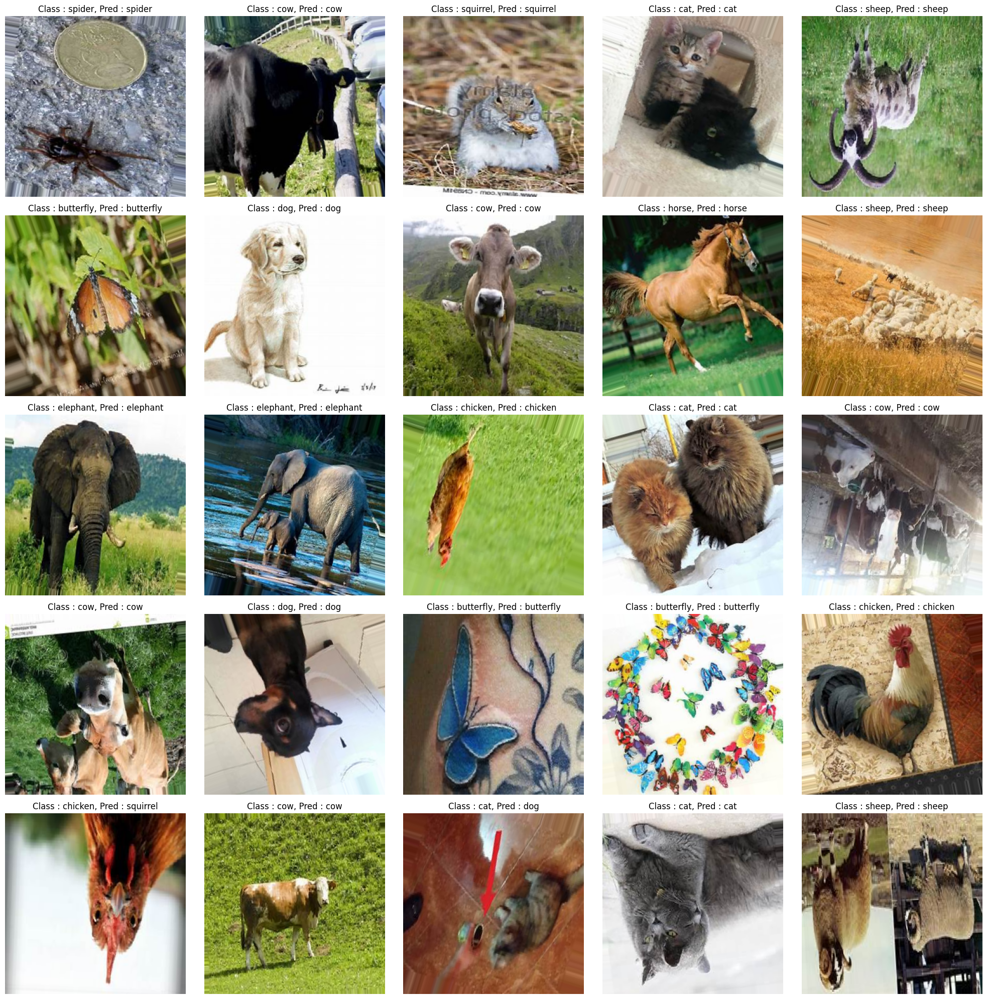

In [ ]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):

    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(loaded_model.predict(image[np.newaxis,...]))]

    # Plot it
    plt.subplot(5,5,i)
    show_image(image, image_title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")

    # Make sure to end the Loop
    i+=1
    if i>=26: break


plt.tight_layout()
plt.show()

Dari output tersebut, kita dapat melihat bahwa model ResNet152V2 yang sudah dilatih sebelumnya tampil dengan baik pada dataset validasi, karena semua prediksi yang dihasilkan oleh kode ini benar. Hal ini menjadi indikasi yang baik bahwa model telah berhasil mempelajari cara mengklasifikasikan gambar dengan tepat dan dapat digunakan untuk memprediksi kelas dari gambar-gambar yang belum pernah dilihat sebelumnya.


## Kesimpulan<a id='conclusion'></a>
Penelitian ini melakukan perbandingan performa tiga arsitektur Convolutional Neural Network (CNN) terkemuka, yaitu ResNet152V2, InceptionV3, dan Xception, dalam klasifikasi spesies hewan menggunakan pendekatan transfer learning. Masing-masing model dilatih dan dievaluasi berdasarkan akurasi validasi dan pelatihan.

Berdasarkan hasil yang diperoleh:

ResNet152V2 berhasil mencapai akurasi validasi tertinggi sebesar 91,43% hanya dalam 3 epoch, dan meningkat menjadi 92,1% pada data pelatihan setelah 7 epoch. Hal ini menunjukkan bahwa model ini memiliki kemampuan generalisasi yang sangat baik dan belajar dengan cepat.

InceptionV3 mencapai akurasi validasi sebesar 89,32% setelah 6 epoch, menunjukkan performa yang cukup baik dengan efisiensi pelatihan yang stabil.

Xception meraih akurasi validasi sebesar 88,06% setelah 7 epoch pelatihan, sedikit di bawah dua model lainnya.

Dengan mempertimbangkan kecepatan konvergensi, akurasi validasi, dan akurasi pelatihan, ResNet152V2 terbukti sebagai model terbaik dalam penelitian ini. Arsitekturnya yang dalam dan penggunaan residual connections membantu model ini menangani kompleksitas fitur citra dengan lebih baik.

Kesimpulan ini memperkuat bahwa pemilihan arsitektur CNN yang tepat sangat penting dalam tugas klasifikasi citra, dan pendekatan transfer learning dapat secara signifikan meningkatkan akurasi meskipun jumlah data pelatihan terbatas.